In [2]:
# using MKL
using SpecialFunctions
import Plots
# Plots.gr()
# using GLMakie
# using Makie
using CairoMakie
using LinearAlgebra
using SparseArrays
import JLD
# using Roots
using CSV
using Statistics
using Base.Threads
using DataFrames, Tables
using ThreadsX
using TensorToolbox
using Octavian

In [3]:
const global maxmu, R, rstep, kf, xi0, ef, omgd, ecut, Nstates, rangecut = 159/2, 30., 0.01, 1., 7.6, 12., 10., 10., 200, 8.;
const ris = collect(0:rstep:R);

In [5]:
cd();cd("Documents/FXW/STM_votex");pwd()

"/home/physicsmaster/Documents/FXW/STM_votex"

In [71]:
besselzeros = CSV.read("/home/physicsmaster/Documents/FXW/STM_votex/bessel_function_table.CSV", DataFrame, header=false);

alpha(i, m) = besselzeros[Int[m+1], Int[i]][1,1];

scN(i,m) = R*besselj(m + 1, alpha(i, m)) / sqrt(2);

phi(i,m,r)=1/scN(i,m)*besselj(m,alpha(i,m)/R*r);

function phini(mu, switch, basisrange)
    templist = zeros(Int(basisrange[2] - basisrange[1] + 1),Int(R/rstep + 1))
    for i in range(start=basisrange[1], stop=basisrange[2])
        templist[i,:] = phi.(i, abs(mu + switch * 1/2), ris)
    end
    return templist
end

function  ffermi(iotaE, Ttempe)
    Ttempe == 0 ? (iotaE > 0 ? 0 : 1) : 1 / (exp((1.75*(iotaE)/Ttempe)) + 1)
end

function processeigen(HBdG)
    data = eigen(HBdG)
    dataeigbef = vcat(data.values', data.vectors)
    positive_part = [dataeigbef[:,i] for i in 1:length(dataeigbef[1,:]) if dataeigbef[:,i][1] > 0]
    negative_part = sort([dataeigbef[:,i] for i in 1:length(dataeigbef[1,:]) if dataeigbef[:,i][1] < 0], rev=true);
    dataeigbef = hcat(hcat(positive_part...), hcat(negative_part...))
    return dataeigbef
end;
function generate_phi()
    global phinivm = zeros(Integer(maxmu+1/2), Nstates, Integer(R/rstep+1))
    global phinivp = zeros(Integer(maxmu+1/2), Nstates, Integer(R/rstep+1))
    @threads for i in 1:Integer(maxmu+1/2)
        phinivm[i,:,:] = phini(i-1/2, -1, [1, Nstates]);
    end
    for i in 1:Integer(maxmu+1/2-1)
        phinivp[i,:,:] = phinivm[i+1, :, :]
    end
    phinivp[end,:,:] = phini(maxmu, 1, [1, Nstates]);
end;
function HBdGinit(br)
    mu = br[3]
    spdiagm(vcat(map(i->ef/(kf*xi0)^2 * (alpha(Int(i), abs(mu - 1/2))/R)^2 - ef, br[1]:br[2]), map(i-> -ef/(kf*xi0)^2 * (alpha(Int(i), abs(mu + 1/2))/R)^2 + ef, br[1]:br[2])))
end;
function HBdG(mu)
    cycle == 1 ? deltamat = phinivm[Int(mu+1/2),:,:] * spdiagm(rstep.*ris.* abs.(deltainit)) * phinivp[Int(mu+1/2),:,:]' : deltamat = phinivm[Int(mu+1/2),:,:] * spdiagm(rstep.*ris.* abs.(deltanow)) * phinivp[Int(mu+1/2),:,:]';
    hbdginitmat = hbdginitmatall[Int(mu + 1/2),:,:];
    hbdginitmat[1 : Nstates, Nstates + 1 : 2*Nstates] = deltamat;
    hbdginitmat[Nstates + 1 : 2*Nstates, 1 : Nstates] = transpose(deltamat);
    return hbdginitmat
end;
function deltaana(xi0, xi1, r)
    r == 0 ? 0 : 1/(1+(xi0*exp(-(r/xi1)))/r)
end;

function fdelta(mu, dataeigbef)

    cutnumberp = filter(x->x>0 && x < omgd, dataeigbef[1,:]) |> length
    cutnumbern = filter(x->x<0 && x> -omgd, dataeigbef[1,:]) |> length
    c1 = hcat(dataeigbef[2:Nstates+1, 1:cutnumberp], dataeigbef[2:Nstates+1, Nstates+1:Nstates+cutnumbern]);
    c2 = hcat(dataeigbef[Nstates+2:end, 1:cutnumberp], dataeigbef[Nstates+2:end, Nstates+1:Nstates+cutnumbern])
    fE = spdiagm(vcat(ffermi.(dataeigbef[1,1:cutnumberp], temp), ffermi.(dataeigbef[1,Nstates+1:Nstates+cutnumbern], temp)))
    fmE = spdiagm(vcat(ffermi.(-dataeigbef[1,1:cutnumberp], temp), ffermi.(-dataeigbef[1,Nstates+1:Nstates+cutnumbern], temp)))
    tab1 = c1 * fE * conj(c2)'
    tab2 = c1 * fmE * conj(c2)'
    tab3 = c2 * conj(c2)'
    new_delta = g * diag(
        matmul(matmul(phinivm[Int(mu+1/2),:,1:Int(rangecut/rstep+1)]', (tab2 - tab1)),
         conj(phinivp[Int(mu+1/2),:,1:Int(rangecut/rstep+1)]))) # constrain range of delta
end;


function fcycle(epochs=40, plot=false, conv=1e-4)

    global cycle, deltanow, deltadata, dataeigbefall
    
    while (if cycle == 1 true; else norm(deltadata[:,end-1] - deltadata[:, end]) / norm(deltadata[:, end-1]) > conv end) && cycle < epochs    

        @threads for mu in 1/2:1:maxmu

            dataeigbefall[Int(mu+1/2),:,:] = processeigen(HBdG(mu))   

        end

        deltanow = vcat(sum(fdelta(mu, dataeigbefall[Int(mu+1/2),:,:]) for mu in 1/2:1:maxmu), ones(Int(R/rstep - rangecut/rstep)))

        deltadata = hcat(deltadata, deltanow)
        cycle += 1
        println("cycle = $cycle")
        println("convergency: ", norm(deltadata[:,end-1] - deltadata[:, end]) / norm(deltadata[:, end-1]), "\n")
        
        # display(lines(ris, deltanow[], color=:red))
        if plot == true display(Plots.plot(ris, deltanow, color=:red)) else nothing end
    end
    @threads for mu in 1/2:1:maxmu

        dataeigbefall[Int(mu+1/2),:,:] = processeigen(HBdG(mu))   

    end
    # Plots.plot(ris, deltanow, linewidth=2, color=:red, title="Δnow(r)")
end;

gaussian(IotaE, omega, sigma=0.01) = 1/(sqrt(2pi) * sigma) * exp(-1/2 * ((omega - IotaE) / sigma)^2)

# function ldos(mu, dataeigbef, omega, sigma)

#     c1 = dataeigbef[2:Nstates+1, :];
#     c2 = dataeigbef[Nstates+2:end, :];
#     dfvec = spdiagm(gaussian.(dataeigbef[1,:], omega, sigma))
#     dfvecm = spdiagm(gaussian.(-dataeigbef[1,:], omega, sigma))
#     tab1 = c1 * dfvec * conj(c1)'
#     tab2 = c2 * dfvecm * conj(c2)'
#     dos = diag(phinivm[Int(mu+1/2),:,1:Int(rangecut/rstep+1)]' * tab1 * conj(phinivm[Int(mu+1/2),:,1:Int(rangecut/rstep+1)])) + 
#     diag(phinivp[Int(mu+1/2),:,1:Int(rangecut/rstep+1)]' * tab2 * conj(phinivp[Int(mu+1/2),:,1:Int(rangecut/rstep+1)]))  # constrain range of delta
# end;

function ldos(mu, dataeigbef, omega, sigma)

    c1 = dataeigbef[2:Nstates+1, :];
    c2 = dataeigbef[Nstates+2:end, :];
    dfvec = spdiagm(gaussian.(dataeigbef[1,:], omega, sigma))
    dfvecm = spdiagm(gaussian.(-dataeigbef[1,:], omega, sigma))
    tab1 = c1 * dfvec * conj(c1)'
    tab2 = c2 * dfvecm * conj(c2)'
    dos = diag(matmul(matmul(phinivm[Int(mu+1/2),:,1:Int(rangecut/rstep+1)]' , tab1) , conj(phinivm[Int(mu+1/2),:,1:Int(rangecut/rstep+1)]))) + 
    diag(matmul(matmul(phinivp[Int(mu+1/2),:,1:Int(rangecut/rstep+1)]' , tab2) , conj(phinivp[Int(mu+1/2),:,1:Int(rangecut/rstep+1)])))  # constrain range of delta
end;


function refinedos(reso, save_data=false, energyrange=1.2, energystep=0.03)
    
    omega_max = energyrange
    omega_step = energystep
    sigma = reso
    omega_list = [-omega_max:omega_step:omega_max;]
    dos = zeros(Int(rangecut/rstep + 1), length(omega_list))
    @threads for i in 1:length(omega_list)

        dos[:, i] = ThreadsX.sum(ldos(j-1/2, dataeigbefall[j,:,:], omega_list[i], sigma) for j in 1:size(dataeigbefall)[1])

    end

    refined_dos = hcat([0.0;[range(0, rangecut, step=rstep);]],vcat(omega_list',dos))

    if save_data == true
        JLD.save("refined_dos_data.jld", "sigma=$(sigma)", refined_dos)
        CSV.write("dos_sigma=$(sigma)_julia.csv", DataFrame(refined_dos, :auto))
    else
        nothing;
    end
    
    # display(Plots.surface(omega_list, [0:rstep:rangecut;], refined_dos[2:end, 2:end], title="sigma=$(sigma)"))
    # display(contour(omega_list, [0:rstep:rangecut;], refined_dos[2:end, 2:end], title="sigma=$(sigma)"))

    return refined_dos

end;

In [66]:
# JLD.save("/home/physicsmaster/Documents/FXW/STM_votex/Nstates=200,R=10.0,rstep=0.01,maxμ=159.5,ϕnivm.jld", "data", phinivm)
# JLD.save("/home/physicsmaster/Documents/FXW/STM_votex/Nstates=200,R=10.0,rstep=0.01,maxμ=159.5,ϕnivp.jld", "data",phinivp)


In [7]:
# generate_phi(); # generate bessel funciton basis if necessary, it takes about 2 mins, or just load 
const phinivm = JLD.load("/home/physicsmaster/Documents/FXW/STM_votex/phiniv.jld")["phinivm"]
const phinivp = JLD.load("/home/physicsmaster/Documents/FXW/STM_votex/phiniv.jld")["phinivp"]
const phiniv = Dict("-1"=>phinivm, "1"=>phinivp)
global br = zeros(Int(maxmu+1/2), 3)
for i in 1:size(br)[1]
    br[i,:] = [1, Nstates, i-1/2]
end
global hbdginitmatall = zeros(Int(maxmu+1/2), 2*Nstates, 2*Nstates)
for i in 1:Int(maxmu+1/2)
    hbdginitmatall[i,:,:] = HBdGinit(br[i,:])
end;
# cycle = 1
const deltainit = convert(Vector{Float64} ,deltaana.(10.,2., ris));
# temp = 0.01;

In [ ]:
cycle = 1

const temp = 0.01

const g = 1/2.4 * (-1)/log(1/(2*omgd));

deltanow = zeros(Int(R/rstep+1))

deltadata = reshape(deltainit, :, 1)

dataeigbefall = zeros(Int(maxmu+1/2), 2*Nstates+1, 2*Nstates)
# deltanow = zeros(Int(rangecut/rstep+1))

fcycle(40, false)

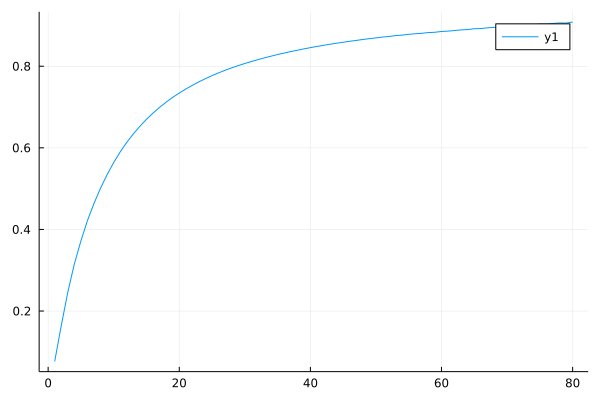

In [10]:
Plots.plot(dataeigbefall[:,1,1])

**Plot DOS**

In [ ]:
Plots.surface(collect(1:3), collect(1:3), rand(3,3))

In [50]:
dos_list = refinedos.([0.01, 0.05, 0.1]);

In [57]:
dos_list_new = refinedos.([0.01, 0.05, 0.1]);

In [ ]:
dos_list[1][2:end, 2:end]

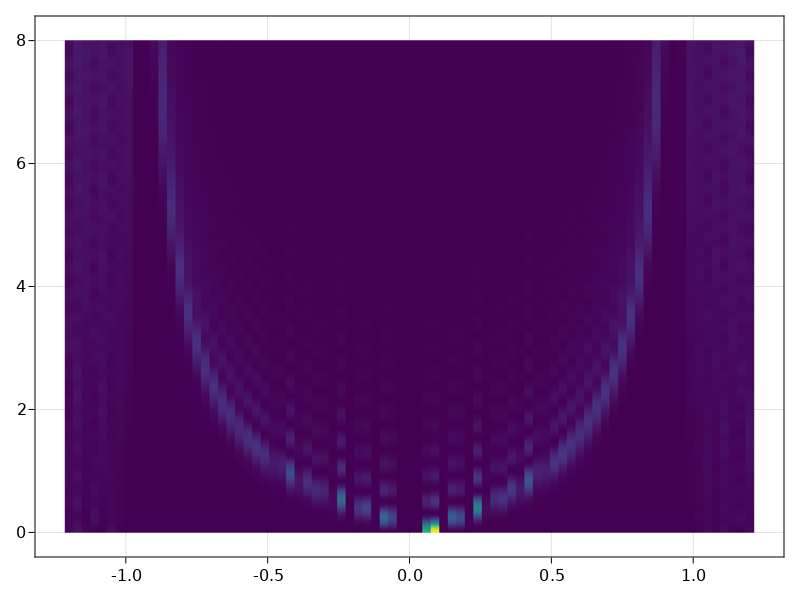

In [19]:
contour(-1.2:0.03:1.2, 0:rstep:rangecut, dos_list[1][2:end, 2:end]', levels=1, linewidth=1, fillrange=true)

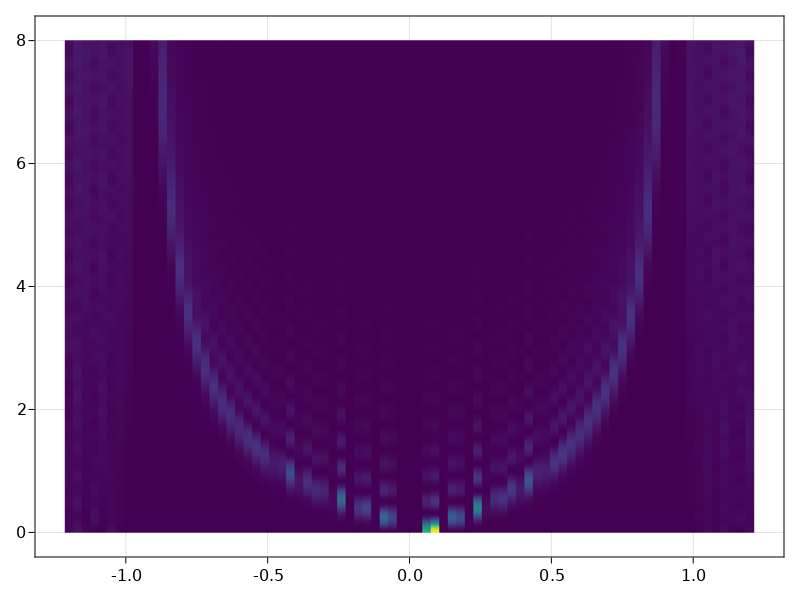

In [58]:
contour(-1.2:0.03:1.2, 0:rstep:rangecut, dos_list_new[1][2:end, 2:end]', levels=1, linewidth=1, fillrange=true)

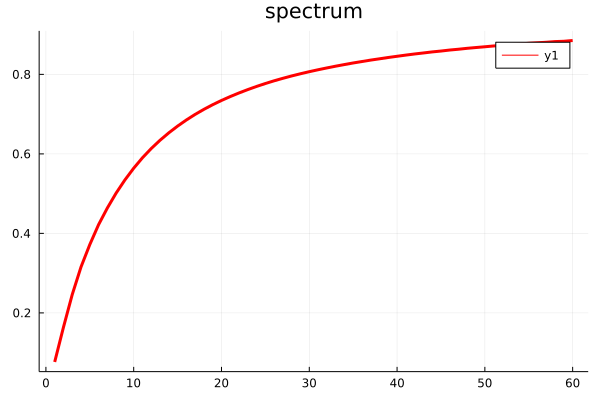

In [20]:
Plots.plot(dataeigbefall[1:60, 1, 1], lw=3, color=:red, title="spectrum")

**non-self consistent with impurities**

In [21]:
function phir(r)

    imp_phir = zeros(2, Int(maxmu+1/2), Nstates)
    
    imp_phir[1,:,:] = reduce(hcat, [phi.(l, [0:Int(maxmu-1/2);], r) for l in 1:Nstates])
    imp_phir[2,:,:] = reduce(hcat, [phi.(l, [1:Int(maxmu+1/2);], r) for l in 1:Nstates])

    return imp_phir
end;


In [22]:
function matv(r0=1.0,v0=1.0,theta0=pi/3, n=1, npr=1)

    phirlist = phir(r0);

    list = permutedims(cat(phirlist[1,:,:] .* dataeigbefall[1:Int(maxmu+1/2),2:Nstates+1, n], phirlist[2,:,:] .* dataeigbefall[1:Int(maxmu+1/2),Nstates+2:end,npr]; dims=3),
    [3,1,2])
    matrix = reshape(sum(sum(permutedims(ttt(list, list), 
    [1, 4, 2, 5, 3, 6]), dims=5), dims=6), (2,2,80,80)) .* [(if sig == sigpr == -1; v0 elseif sig == sigpr == 1; -v0 else v0 end) * r0 * exp(im * (mupr-mu) * theta0) * exp(im * (sigpr - sig)*theta0 / 2)
    for sig in [-1,1], sigpr in [-1,1], mu in 1/2:maxmu, mupr in 1/2:maxmu]
        
    return [matrix[1,1,:,:] matrix[1,2,:,:];
    matrix[2,1,:,:] matrix[2,2,:,:]]
    
end;

matv (generic function with 6 methods)

In [216]:
# function velement(sig, sigpr, mu, mupr, n, npr, v0=1.0, r0=1.0, theta0=pi/3)

#     sum((if sig == sigpr == -1; v0 elseif sig == sigpr == 1; -v0 else v0 end) * r0 * exp(im * (mupr-mu) * theta0) * exp(im * (sigpr - sig)*theta0 / 2) .* (if sig == -1 dataeigbefall[Int(mu+1/2), 2:Nstates+1, n] else dataeigbefall[Int(mu+1/2), Nstates+2:end, n] end)  .*
#         phi.([1:Nstates;], mu+sig/2, r0) * ((if sigpr == -1; dataeigbefall[Int(mupr+1/2), 2:Nstates+1, npr] else dataeigbefall[Int(mupr+1/2), Nstates+2:end, npr] end)  .*
#         phi.([1:Nstates;], mupr+sigpr/2, r0))')
# end

# function matv(n=1, npr=1)

#     imp_matrix = zeros(ComplexF64, Int(2(maxmu+1/2)), Int(2(maxmu+1/2)))
#     mat11 = zeros(ComplexF64, Int(maxmu+1/2), Int(maxmu+1/2))
#     mat12 = zeros(ComplexF64, Int(maxmu+1/2), Int(maxmu+1/2))
#     mat21 = zeros(ComplexF64, Int(maxmu+1/2), Int(maxmu+1/2))
#     mat22 = zeros(ComplexF64, Int(maxmu+1/2), Int(maxmu+1/2))

#     for mu in 1/2:1:maxmu
#         @threads for mupr in 1/2:1:maxmu
#         mat11[Int(mu+1/2), Int(mupr+1/2)] = velement.(-1, -1, mu, mupr, n, npr)
#         mat12[Int(mu+1/2), Int(mupr+1/2)] = velement.(-1, 1, mu, mupr, n, npr)
#         mat21[Int(mu+1/2), Int(mupr+1/2)] = velement.(1, -1, mu, mupr, n, npr)
#         mat22[Int(mu+1/2), Int(mupr+1/2)] = velement.(1, 1, mu, mupr, n, npr)
#         end
#     end

#     imp_matrix = [mat11 mat12;
#                     mat21 mat22]


#     return imp_matrix
# end;

In [23]:
imp_matrix = matv();

In [63]:
imp2_matrix = matv() + matv(1.0, 1.0, 4pi/3, 1, 1);

In [24]:
function psiallmu(sigma, n)

    reduce(hcat, [phiniv["$sigma"][i,:,1:Int(rangecut/rstep+1)]' * 
    (sigma == -1 ? dataeigbefall[1:Int(maxmu+1/2), 2:Nstates+1, n] : dataeigbefall[1:Int(maxmu+1/2), Nstates+2:end, 1])[i,:] for i in 1:Int(maxmu+1/2)])
    
end

maxn = 1

psiallmusigma = Dict("-1"=>[psiallmu(-1, n) for n in 1:maxn], "1"=>[psiallmu(1, n) for n in 1:maxn]);

In [26]:
function emumat(n)

    spdiagm([dataeigbefall[:, 1, n]; dataeigbefall[:,1, Nstates+n]])

end

imp_mat_eigen(imp_matrix) = vcat((eigen(emumat(1) + imp_matrix; permute=true, scale=true).values |> real)', eigen(emumat(1) + imp_matrix; permute=true, scale=true).vectors);

impeigen = imp_mat_eigen(imp_matrix);

In [65]:
function ldosimpuritynew(sigma, energy, theta, reso)

    templist = zeros(ComplexF64, Int(2*maxmu+1), Int((2*maxmu+1) / maxn), maxn)

    for i in 1:Int(2*maxmu+1)
        
        templist[i,:,:] = [reshape(impeigen[2:end,i], (:, maxn)) for i in 1:Int(2*maxmu+1)][i]
    end

    abs2.(reduce(+, [(sigma == -1 ? permutedims(templist[:, 1:Int(maxmu+1/2),:], [3,1,2]) : permutedims(templist[:, Int(maxmu+1/2+1):Int(2*maxmu+1),:], [3,1,2]))[i,:,:] * 
    ([exp(im*(mu+1/2)*theta) for mu in 1/2:1:maxmu, _ in 1:maxn][:,i] .* psiallmusigma["$sigma"][i]') for i in 1:maxn]))' *
    gaussian.(impeigen[1,:] |> real, energy, reso)

end;

In [28]:
function chi(alpha, theta, sigma)

    reduce(hcat, [exp(im * (mu+sigma/2) * theta) * ((if sigma==-1; dataeigbefall[Int(mu+1/2), 2:Nstates+1, 1] else dataeigbefall[Int(mu+1/2), Nstates+2:end, 1] end)' * 
        phiniv["$sigma"][Int(mu+1/2), :, 1:Int(rangecut/rstep+1)])' for mu in 1/2:1:maxmu]) * 
            (if sigma==1; impeigen[2:Int(maxmu+1/2+1), alpha] else impeigen[Int(maxmu+1/2+2):end, alpha] end)
    
end;

In [29]:
function ldosimpurity(energy, theta, reso)
    reduce(hcat, [abs2.(chi(alpha, theta, 1)) for alpha in 1:2*Int(maxmu+1/2)]) * gaussian.(impeigen[1,:] |> real, energy, reso) +
        reduce(hcat, [abs2.(chi(alpha, theta, -1)) for alpha in 1:2*Int(maxmu+1/2)]) * gaussian.(-impeigen[1,:] |> real, energy, reso)
end;

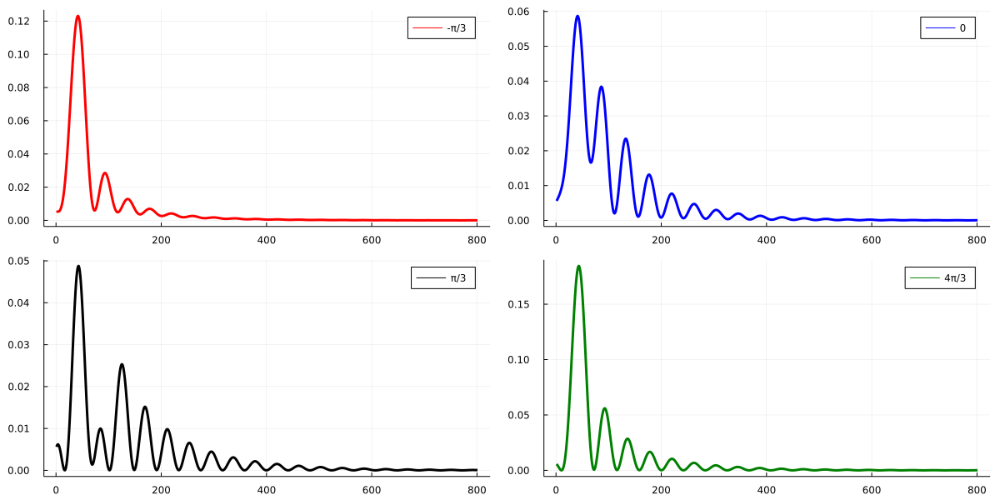

In [63]:
Plots.plot(
    ldosimpuritynew.(-1, 0.3, [-pi/3, 0, pi/3, 4pi/3], 0.01) + ldosimpuritynew.(1, 0.3,  [-pi/3, 0, pi/3, 4pi/3], 0.01),
    layout=(2,2),
    label=["-π/3" "0" "π/3" "4π/3"],
    lw=3,
    size = (1200, 600),
    color = [:red :blue :black :green]
    )

In [ ]:
Plots.plot(ldosimpurity.(0.3, [-pi/3,0,pi/3], 0.01), layout=(3,1), label=["-π/3" "0" "π/3"], lw=3)

In [34]:
function ldosimpall(energy, reso)
    contaniner = zeros(Int(rangecut/rstep+1), length(0:0.2:2pi))
    @threads for theta in 0:0.2:2pi
        contaniner[:, Int(round(5*theta+1))] = ldosimpuritynew(1, energy, theta, reso) + ldosimpuritynew(-1, energy, theta, reso)
    end
    
    return contaniner
end;

In [43]:
CSV.write("julia_impdos_0.5.csv", DataFrame(ldosimpall(0.5, 0.01),:auto))

"julia_impdos_0.5.csv"

In [ ]:
for sigma in [0.01,0.5,0.9], energy in 0.0:0.1:0.9

    println("calculating sigma = $sigma, energy = $energy \n")

    display(Plots.heatmap(thetalist, rangelist, ldosimpall(energy, sigma), proj=:polar))

    # CSV.write("julia_impdos_$(energy)_$(sigma).csv", DataFrame(ldosimpall(energy, sigma),:auto))
    
end

calculating sigma = 0.01


calculating sigma = 0.1


calculating sigma = 0.2


calculating sigma = 0.5


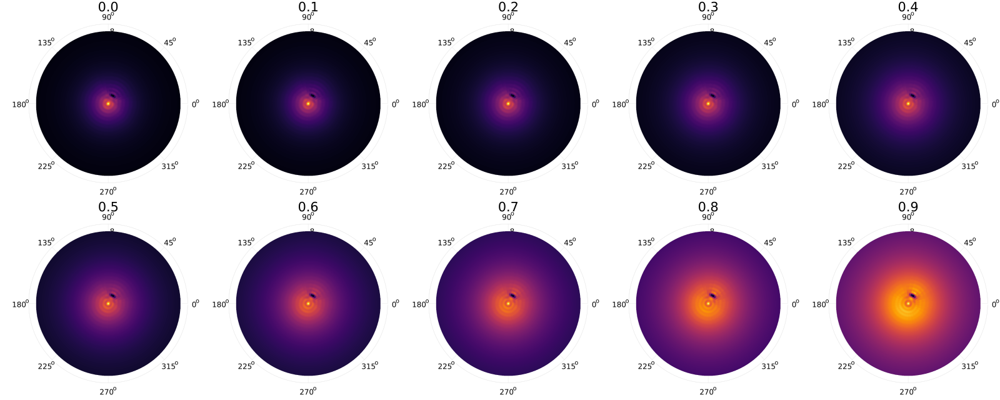

In [67]:
rangelist = [0:0.01:8;];
thetalist = [0:0.2:2pi;];

for sigma in [0.01, 0.1, 0.2, 0.5]
    
    println("calculating sigma = $sigma")    
    
    pp = []

    for energy in 0.0:0.1:0.9

        p = Plots.heatmap(thetalist, rangelist, ldosimpall(energy, sigma), proj=:polar, legend=false)

        push!(pp, p)

    end

    display(Plots.plot(pp..., proj=:polar, layout=(2, 5), size=(320 * 5, 320 * 2), title=[0.0:0.1:0.9;]'))

end

calculating sigma = 0.01


calculating sigma = 0.1


calculating sigma = 0.2


calculating sigma = 0.5


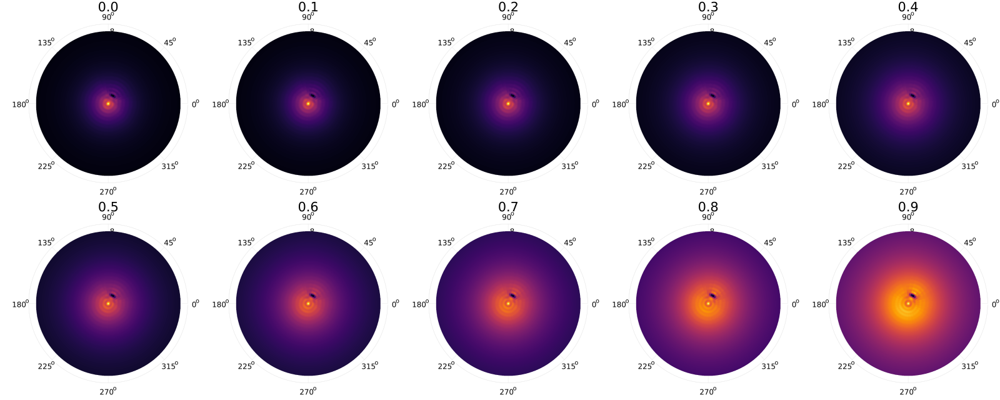

In [69]:
rangelist = [0:0.01:8;];
thetalist = [0:0.2:2pi;];

for sigma in [0.01, 0.1, 0.2, 0.5]
    
    println("calculating sigma = $sigma")    
    
    pp = []

    for energy in 0.0:0.1:0.9

        p = Plots.heatmap(thetalist, rangelist, ldosimpall(energy, sigma), proj=:polar, legend=false)

        push!(pp, p)

    end

    display(Plots.plot(pp..., proj=:polar, layout=(2, 5), size=(320 * 5, 320 * 2), title=[0.0:0.1:0.9;]'))

end

In [ ]:
rangelist = [0:0.01:8;];
thetalist = [0:0.2:2pi;];

for sigma in [0.01,0.5,0.9]
    
    println("calculating sigma = $sigma")    
    
    pp = []

    for energy in 0.0:0.1:0.9

        p = Plots.heatmap(thetalist, rangelist, ldosimpall(energy, sigma), proj=:polar, legend=false)

        push!(pp, p)

    end

    display(Plots.plot(pp..., proj=:polar, layout=(2, 5), size=(350 * 5, 350 * 2), title=[0.0:0.1:0.9;]'))

end

In [ ]:
a = reduce(hcat, [ldosimpall(energy, 0.01) for energy in 0.0:0.1:0.9])